In [1]:
import numpy as np
import scipy.stats as sp
np.random.seed(0)

import matplotlib
import matplotlib.pyplot as plt
import os 
%matplotlib inline
%precision 4

%config InlineBackend.figure_format = 'retina'
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

plt.style.use('ggplot')

%load_ext watermark
%watermark -d -t -u -v -g -r -b -iv -a "Hongsup Shin" 

numpy      1.17.3
matplotlib 3.1.1
Hongsup Shin 
last updated: 2020-01-13 18:35:02 

CPython 3.7.6
IPython 7.11.1
Git hash: 2c0e1f0ae47927e89ce8e7f0ff33c40a8fbf2867
Git repo: git@github.com:hongsups/talent-luck-simulator.git
Git branch: master


# Introduction
This notebook provides the code and analysis for the simulation data in my blog post [**Talent, luck and success: simulating meritocracy and inequality with stochasticity**](https://medium.com/@hongsupshin/talent-luck-and-success-simulating-meritocracy-and-inequality-with-stochasticity-501e0c1b4969). 

The blog post and the main notebook contains the following:
- Summary and replication of the results from the paper, [Talent vs Luck: the role of randomness in success and failure](https://arxiv.org/abs/1802.07068) (Pluchino et al. 2018)
- Simulating various socioeconomical scenarios including:
	- **Scenario 1. Balanced unlucky events** In the original paper, unlucky events always punished individuals regardless of their talent. Here, individuals with higher talent have higher likelihood of not being affected by bad luck.
	- **Scenario 2. Talent directly affects the return of luck** Talent directly affects how much individuals may profit or lose from the lucky or unlucky events, respectively.
	- **Scenario 3. Paycheck (“Hard work pays off”)** Individuals have fixed income added to their asset (capital) regularly regardless of the luck-related events.
	- **Scenario 4. Interest rate** At every time step (every 6 months), the capital increases based on an interest rate.
	- **Scenario 5. “The rich get luckier, the poor get unluckier”** The rich is more likely to get away with unlucky events but the poor is likely to face unlucky events more often.
	- **Scenario 6. Income tax** Individuals pay income-based tax at every time period.
	- **Scenario 7. Social safety net** One’s capital cannot go lower than the starting amount.

# The base model
[The original paper](https://arxiv.org/abs/1802.07068) simulated lucky and unlucky events randomly as if they are [Brownian motion](https://en.wikipedia.org/wiki/Brownian_motion) in a two dimensional space. As I mentioned in the blog, mathematically speaking, this is essentially equivalent to simulating a [Bernoulli process](https://en.wikipedia.org/wiki/Bernoulli_process) (i.e., coin-flip with a certain probability). 

### Event, $E$
We define an event $E$ as a binary variable ($0$ for an unlucky event and $1$ for a lucky event) drawn from a Bernoulli with a certain probability $P_{event}$:

$$E \sim Bernoulli(P_{event})$$

### Probability of being lucky and unlucky: $P_{lucky}$, $P_{unlucky}$
$$P_{unlucky} = 1-P_{lucky}$$

## Capital, $C$
- $C_{0}$: The initial amount of capital at the beginning of simulation

In [2]:
# no. of individuals
N = 1000 

# mean, std talent
mu_T = 0.6 
std_T = 0.1

# 40 years, every 6 months
N_timestamps = 80 

# one lucky or unlucky event for every 10 years
P_event = 1/20 

# if an event happens there's prob. of P_lucky that the event is lucky
P_lucky = 0.5
P_unlucky = 1 - P_lucky

# initial capital value
C_0 = 10

In [916]:
def lucky_event(C_prev, T, coeff=2):
    
    rand_num = np.random.random()
    if rand_num < T:
        C_next = coeff*C_prev
    else:
        C_next = C_prev    
    return C_next

def unlucky_event(C_prev, T, coeff=1/2):
    
    C_next = coeff*C_prev
    return C_next

In [917]:
def run_sim(P_event=1/20, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
            C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.normal(mu_T, std_T, N, )
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = lucky_event(C, T, coeff_lucky)
                else:
                    C = unlucky_event(C, T, coeff_unlucky)

        Cs.append(C)

    return Cs, Ts

In [889]:
def plot_C_over_t(Cs_t, results_t, s_title='', scale='log', fname='test'):

    plt.figure(figsize=(20,8))
    plt.plot(Cs_t,':',color='gray')
    for event_ind, color in zip([-1, 1], (colors[3], colors[0])):
        inds = np.argwhere(results_t==event_ind)
        plt.plot(inds, Cs_t[inds], '.', color=color, markersize=30)
        
    plt.title(s_title, fontsize=30)
    plt.xlabel('Time', fontsize=30)
    plt.ylabel('Capital', fontsize=30)
    plt.yscale(scale)
    plt.tick_params(labelsize='x-large')
    plt.tight_layout()

    if fname:
        plt.savefig(fname+'.png')
    
    plt.show()

In [752]:
Cs, Ts = run_sim(P_event=0.1, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                          C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)

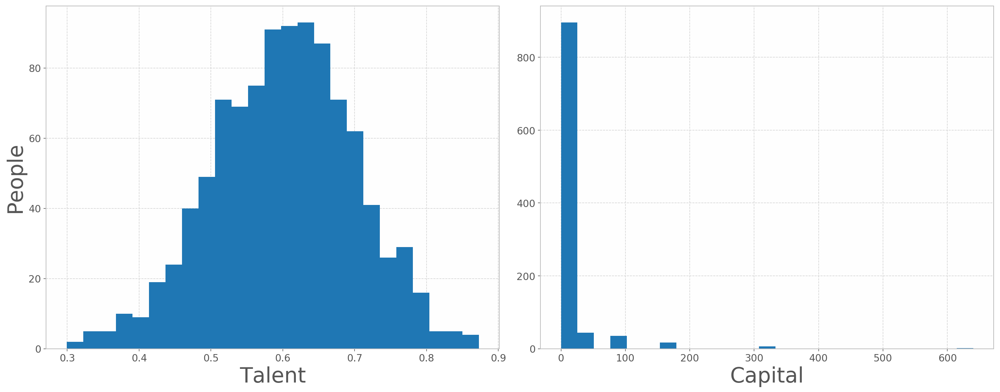

In [760]:
fig, axes = plt.subplots(1, 2, figsize=(20,8))

fontsize = 30
axes[0].hist(Ts, bins=25)
axes[0].set_xlabel('Talent', fontsize=fontsize)
axes[0].set_ylabel('People', fontsize=fontsize)

axes[1].hist(Cs, bins=25)
axes[1].set_xlabel('Capital', fontsize=fontsize)

plt.tight_layout()
plt.savefig('talent_capital_hist.png')
plt.show()

Text(0,0.5,'Frequency')

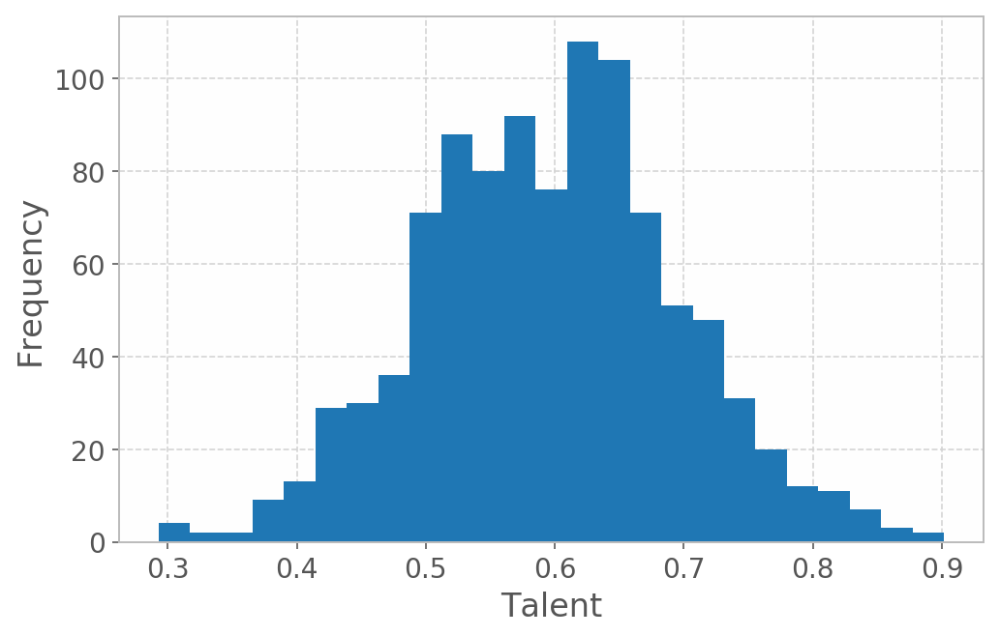

In [742]:
Ts = np.random.normal(mu_T, std_T, N)
plt.figure(figsize=(8,5))
plt.hist(Ts, bins=25)
plt.xlabel('Talent')
plt.ylabel('Frequency')

our model

In [882]:
def run_sim_all(P_event=1/20, P_lucky0=0.5, use_default=False,
                w_Talent=1, interest_rate=0, 
                min_tax_rate=0.1, max_tax_rate=0.4,
                N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                turn_on_rich=False, turn_on_tax=False, turn_on_safenet=False,
                T_dist='normal', C_even=True, mu_C=10, std_C=2):

    if T_dist == 'normal':
        Ts = np.random.normal(mu_T, std_T, N)
    elif T_dist == 'uniform':
        Ts = np.random.random(N)

    if C_even:
        C0s = np.ones(N)*mu_C
    else:
        C0s = np.random.normal(mu_C, std_C, N)    
    
    events_all = np.random.binomial(1, P_event, (N_timestamps, len(Ts)))    
    
    P_lucky0 = np.ones(N)*P_lucky0
    tax_rates0 = np.ones(N)*min_tax_rate

    Cs_prev = C0s
    P_lucky = P_lucky0
    tax_rates = tax_rates0
    Cs_all = [Cs_prev]
    results_all = []
    for event_all in events_all:

        rands = np.random.random(N)
        good_luck = (rands < P_lucky)*event_all
        bad_luck = -1*(rands >= P_lucky)*event_all

        # nothing=0, good luck=1, bad luck = 0
        results = good_luck + bad_luck

        # apply events
        Cs_next = (results==0)*neutral(interest_rate, w_Talent, Ts, Cs_prev) \
                  + (results>0)*lucky(interest_rate, Ts, Cs_prev, use_default)       \
                  + (results<0)*unlucky(interest_rate, Ts, Cs_prev, use_default)

        # update parameters (recalibrate luck based on capital distribution)
        if turn_on_tax:
            tax_rates = sp.norm.cdf(sp.mstats.zscore(Cs_next))*(max_tax_rate-min_tax_rate)+min_tax_rate
            Cs_next = Cs_next*(1-tax_rates)
        
        if turn_on_rich:
            P_lucky = sp.norm.cdf(sp.mstats.zscore(Cs_next))
            
        if turn_on_safenet:
            Cs_next = np.max([Cs_next, C0s], axis=0)
            
        Cs_prev = Cs_next
        
        Cs_all.append(Cs_next)
        results_all.append(results)

    results_all.append(np.zeros(N))
        
    return Cs_next, Ts, np.array(Cs_all), np.array(results_all)

In [883]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, use_default=True)

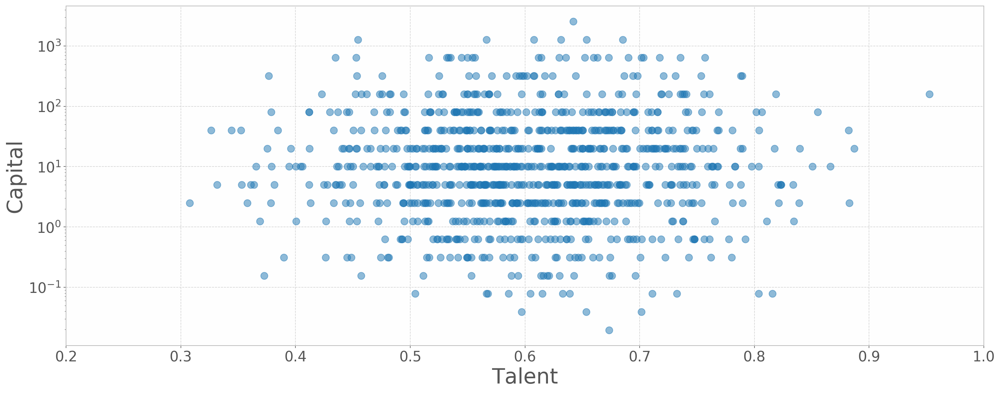

In [890]:
plt.figure(figsize=(20,8))
plt.plot(Ts, Cs, 'o', alpha=0.5, markersize=10)
plt.xlim(0.2,1)
plt.xlabel('Talent', fontsize=30)
plt.ylabel('Capital', fontsize=30)
plt.yscale('log')
plt.tick_params(labelsize='x-large')
plt.tight_layout()
plt.savefig('capital-talent-scatter-default.png');

Various P_events and capital

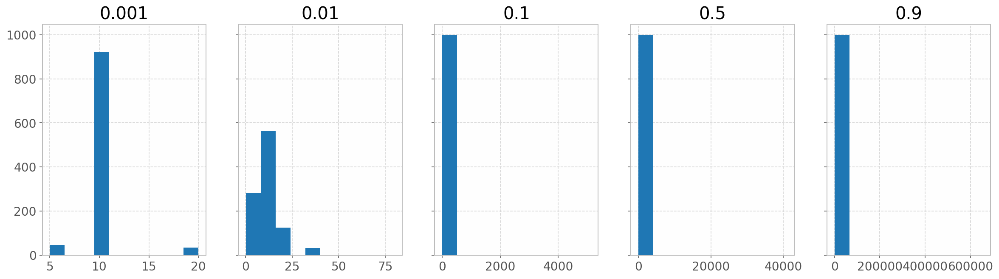

In [11]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.hist(Cs)
    ax.set_title(str(P_event))

plt.show();

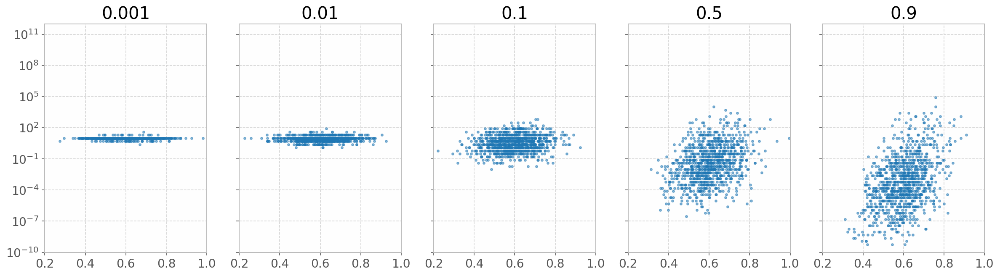

In [918]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_yscale('log')
    ax.set_title(str(P_event))

plt.show();

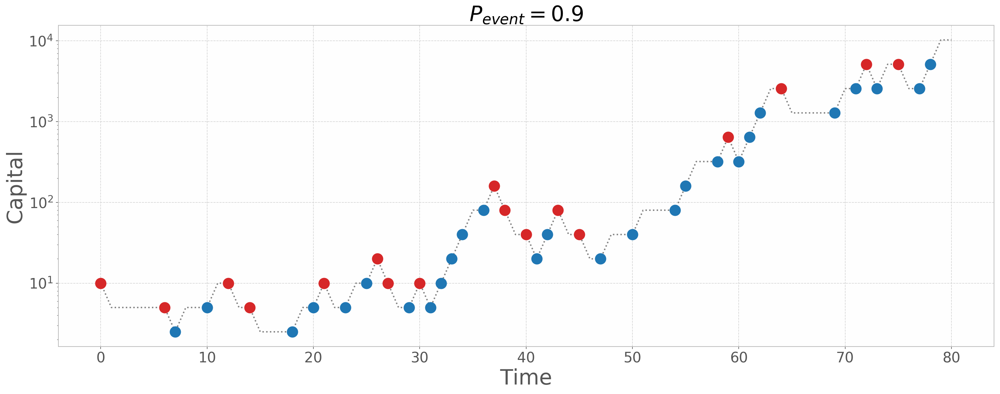

In [949]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.5, w_Talent=0, use_default=True)
plot_C_over_t(Cs_all[:,0], results_all[:,0], '$P_{event}=0.9$', fname='test_0.9')

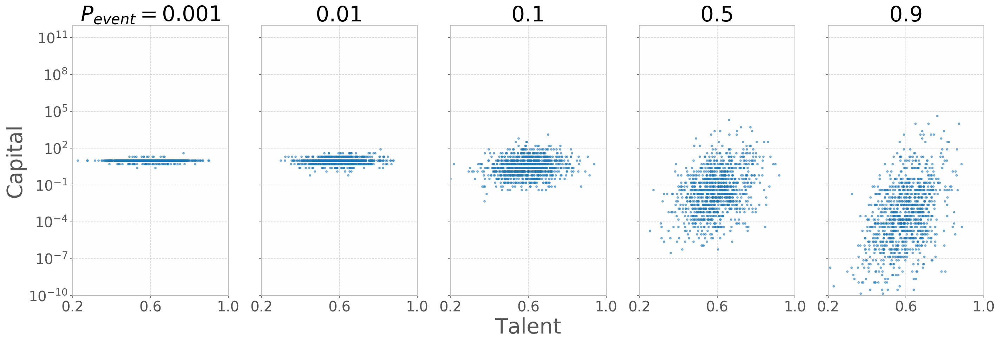

In [927]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts = run_sim(P_event)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('effect_of_stochasticity.png')
plt.show();

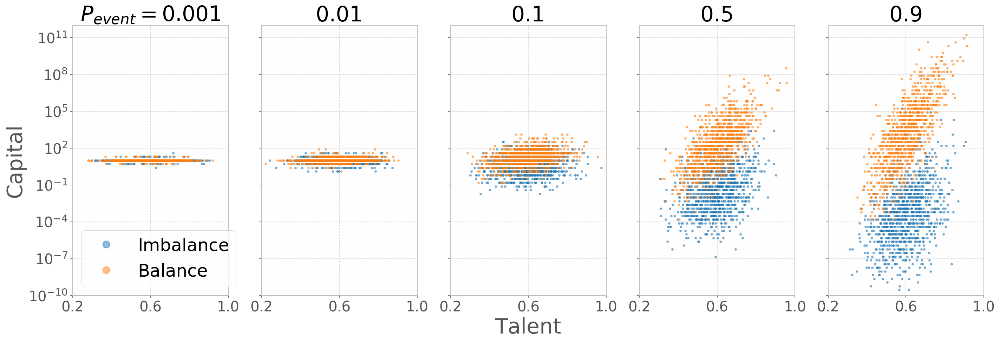

In [940]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts = run_sim(P_event)
    Cs_, Ts_ = run_sim_fair_unlucky(P_event)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='Imbalance')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='Balance')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='lower left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('compare_balanced_unlucky.png')
plt.show();

## equal talents

In [130]:
def run_sim_uniform_talent(P_event=1/20, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                           C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.random(N)
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = lucky_event(C, T, coeff_lucky)
                else:
                    C = unlucky_event(C, T, coeff_unlucky)

        Cs.append(C)

    return Cs, Ts

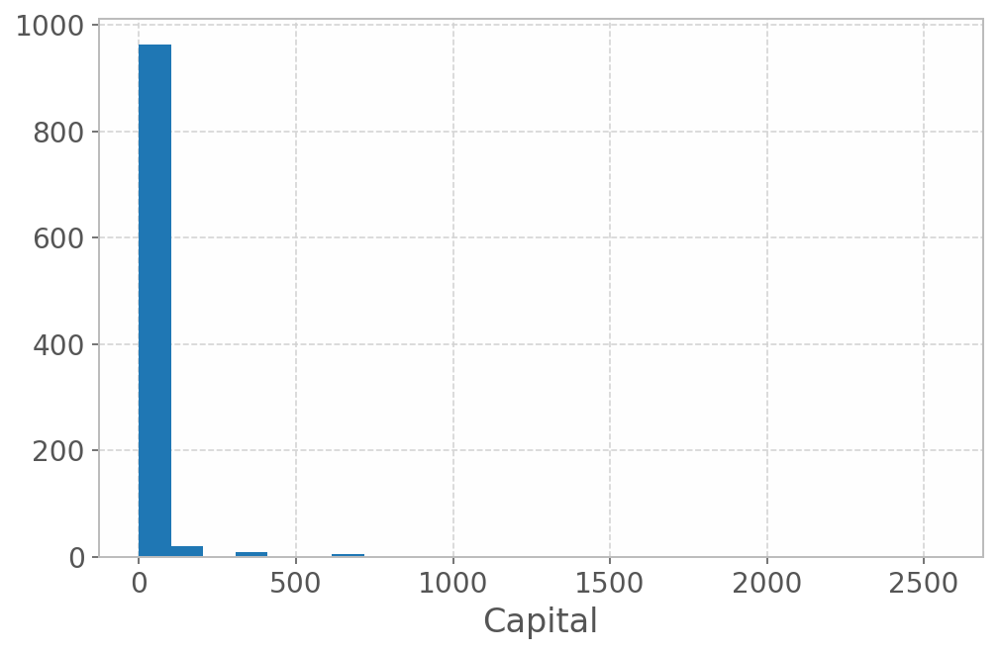

In [891]:
Cs, Ts = run_sim_uniform_talent(P_event=0.1, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                          C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)

plt.figure(figsize=(8,5))
plt.hist(Cs, bins=25)
plt.xlabel('Capital');

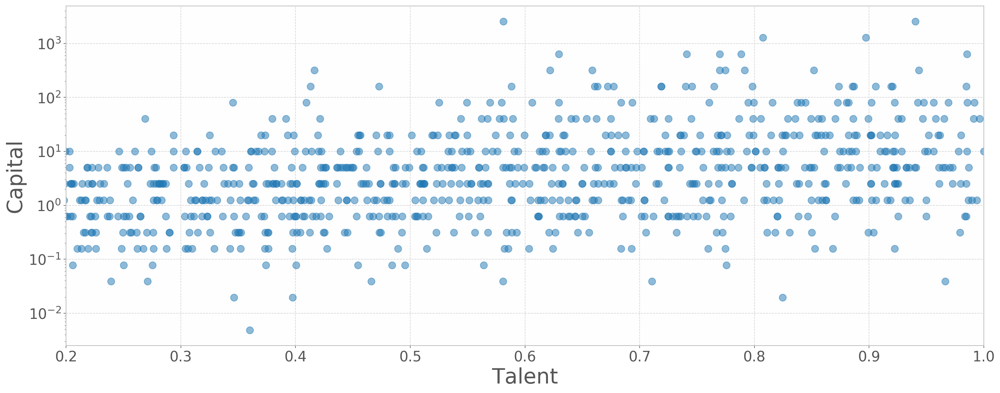

In [895]:
plt.figure(figsize=(20,8))
plt.plot(Ts, Cs, 'o', alpha=0.5, markersize=10)
plt.xlim(0.2,1)
plt.xlabel('Talent', fontsize=30)
plt.ylabel('Capital', fontsize=30)
plt.yscale('log')
plt.tick_params(labelsize='x-large')
plt.tight_layout()
plt.savefig('capital-talent-scatter-uniform.png');

# Talented people are less affected by unlucky events

In [13]:
def fair_unlucky_event(C_prev, T, coeff=1/2):
    
    rand_num = np.random.random()
    if rand_num > T:
        C_next = coeff*C_prev
    else:
        C_next = C_prev    
    return C_next

In [14]:
def run_sim_fair_unlucky(P_event=1/20, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
            C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.normal(mu_T, std_T, N, )
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = lucky_event(C, T, coeff_lucky)
                else:
                    C = fair_unlucky_event(C, T, coeff_unlucky)

        Cs.append(C)

    return Cs, Ts

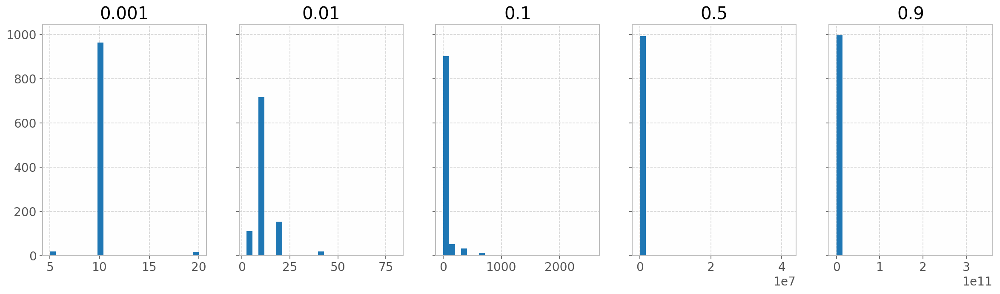

In [145]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_fair_unlucky(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                                  C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.hist(Cs, bins=25)
    ax.set_title(str(P_event))

plt.show();

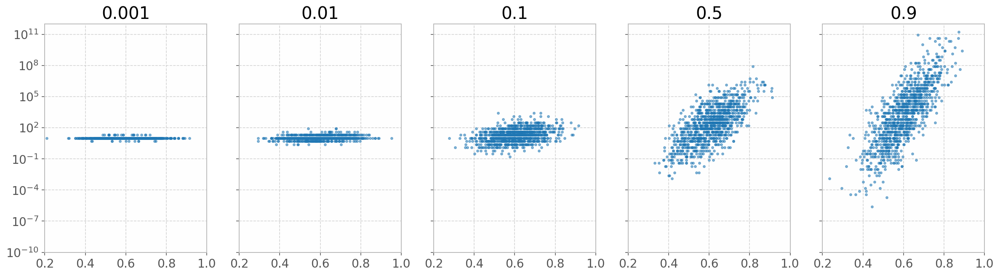

In [16]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_fair_unlucky(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                                  C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

## Fair vs. unfair unlucky

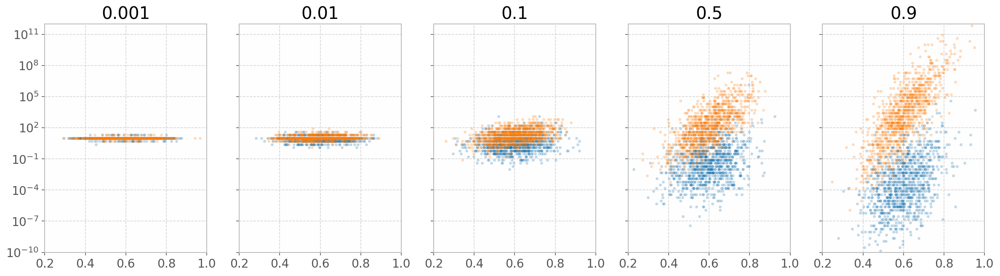

In [149]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    Cs_, Ts_ = run_sim_fair_unlucky(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Unfair')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Fair')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_yscale('log')
    ax.set_title(str(P_event))

# plt.legend()    
plt.show();    

# Talent affects the results of lucky/unlucky events

In [152]:
def gabe_lucky_event(C_prev, T):
    
    C_next = (1+T)*C_prev
    return C_next

def gabe_unlucky_event(C_prev, T):
    
    C_next = T*C_prev
    return C_next

In [153]:
def run_sim_talent_luck(P_event=1/20, P_lucky=0.5, C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.normal(mu_T, std_T, N)
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = gabe_lucky_event(C, T)
                else:
                    C = gabe_unlucky_event(C, T)

        Cs.append(C)

    return Cs, Ts

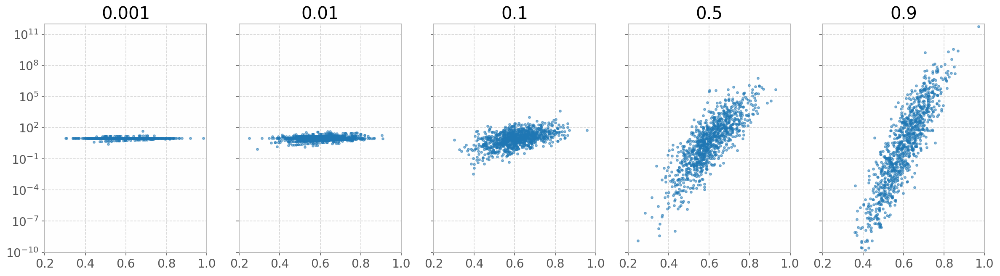

In [154]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_talent_luck(P_event=P_event, P_lucky=0.5,
                                 C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

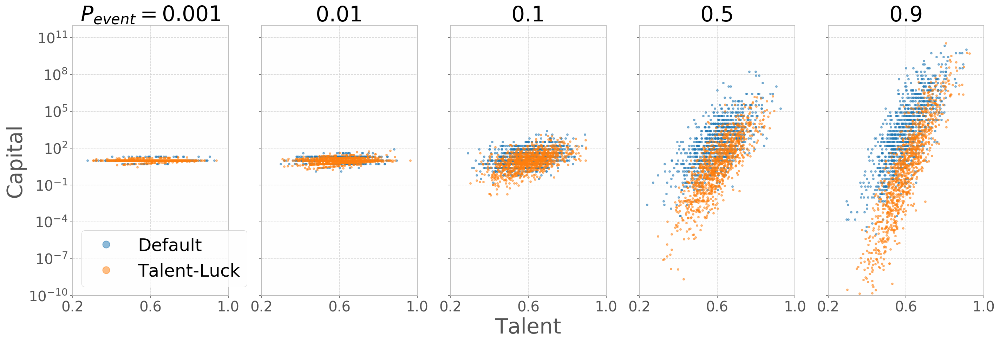

In [942]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    
    Cs, Ts = run_sim_fair_unlucky(P_event=P_event)
    Cs_, Ts_, _, _ = run_sim_all(P_event, w_Talent=0)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='Talent-Luck')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='lower left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('compare_talent_affects_luck.png')
plt.show();

## Fixed vs. talent-dependent luck

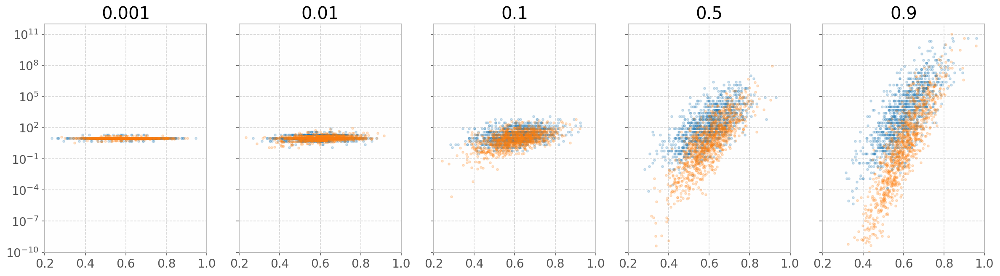

In [156]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_fair_unlucky(P_event=P_event, P_lucky=0.5, coeff_lucky=2, coeff_unlucky=1/2, 
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    Cs_, Ts_ = run_sim_talent_luck(P_event=P_event, P_lucky=0.5,
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Fixed')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Talent-dependent')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_yscale('log')
    ax.set_title(str(P_event))

# plt.legend()    
plt.show();    

# "Return to work": monetary returns from working

In [20]:
def run_sim_talent_luck_work(P_event=1/20, P_lucky=0.5, w_Talent=1, 
                             C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.normal(mu_T, std_T, N, )
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C + T*w_Talent
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = gabe_lucky_event(C, T)
                else:
                    C = gabe_unlucky_event(C, T)

        Cs.append(C)

    return Cs, Ts

## Varying P_events

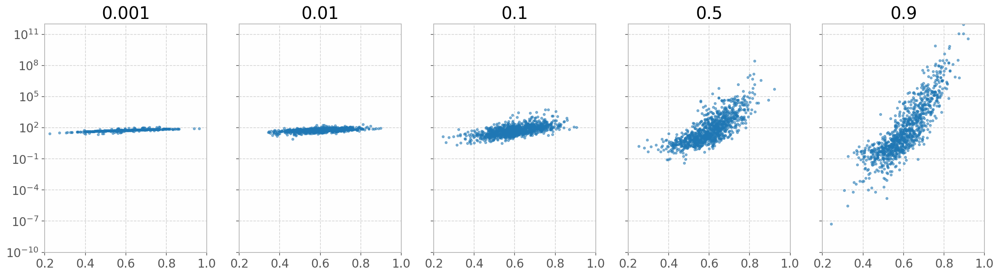

In [21]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_talent_luck_work(P_event=P_event, P_lucky=0.5, w_Talent=1,
                                      C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

## Default vs. hard work

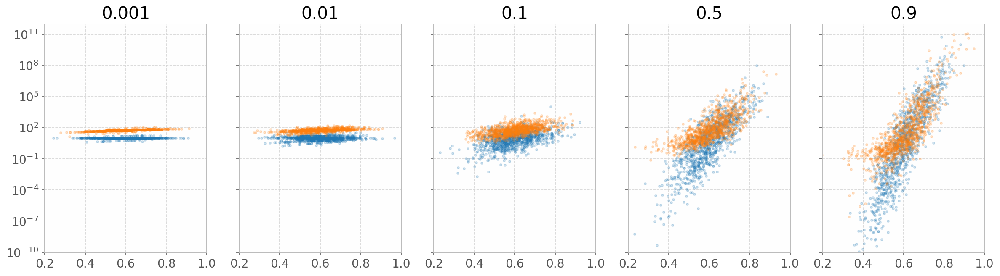

In [158]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_talent_luck(P_event=P_event, P_lucky=0.5,
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    Cs_, Ts_ = run_sim_talent_luck_work(P_event=P_event, P_lucky=0.5, w_Talent=1,
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Hard work')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

# plt.legend()
plt.show();

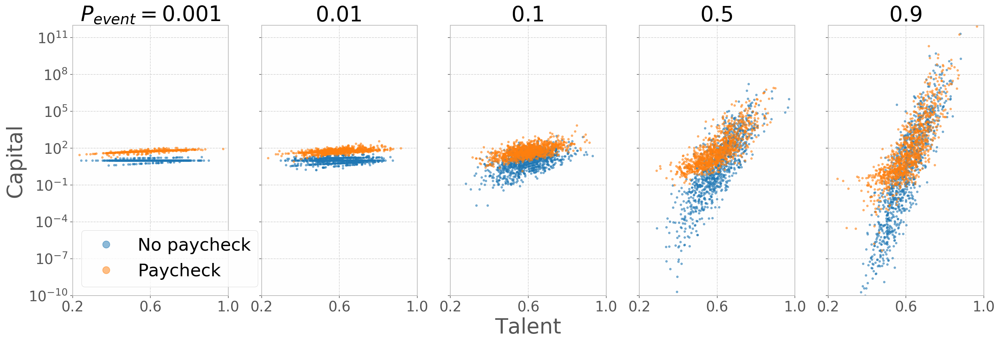

In [980]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event, w_Talent=0)
    Cs_, Ts_, _, _ = run_sim_all(P_event, w_Talent=1)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='No paycheck')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='Paycheck')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='lower left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('compare_paycheck.png')
plt.show();

## Varying weights, P_event = 0.1

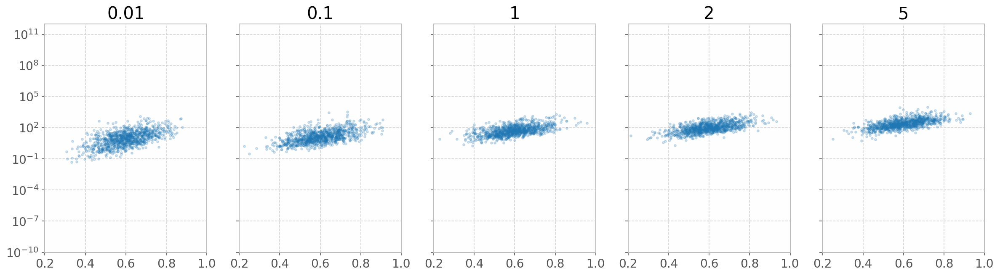

In [973]:
w_Talents = [0.01, 0.1, 1, 2, 5]

fig, axes = plt.subplots(1, len(w_Talents), sharey=True, figsize=(20,5))
for w_Talent, ax in zip(w_Talents, axes):
    
    Cs, Ts = run_sim_talent_luck_work(P_event=0.1, P_lucky=0.5, w_Talent=w_Talent,
                                      C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(w_Talent))

plt.show();

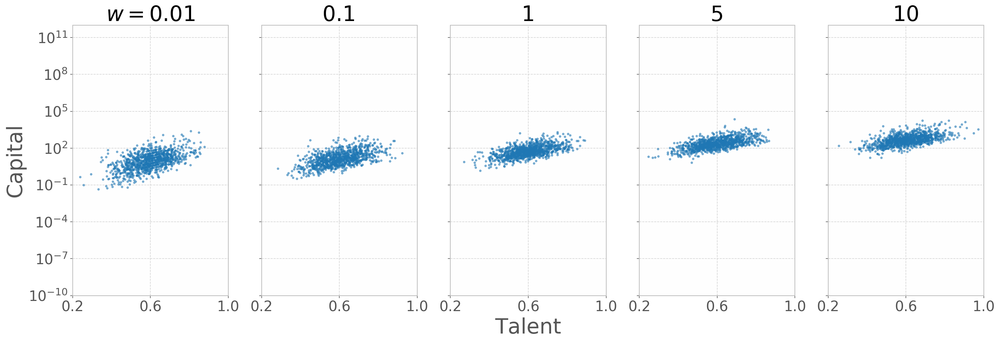

In [977]:
w_Talents = [0.01, 0.1, 1, 5, 10]

fig, axes = plt.subplots(1, len(w_Talents), sharey=True, figsize=(20,7))
for i, (w_Talent, ax) in enumerate(zip(w_Talents, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event=0.1, w_Talent=w_Talent)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$w=$'+str(w_Talent), fontsize=30)
    else:
        ax.set_title(str(w_Talent), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('paycheck_effect_varying_w.png')
plt.show();

# Capitalism (interest rate)

In [166]:
def run_sim_talent_luck_work_capitalism(P_event=1/20, P_lucky=0.5, w_Talent=1, interest_rate=0.05,
                                        C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000):

    Ts = np.random.normal(mu_T, std_T, N, )
    Cs = []
    for T in Ts:
        events = np.random.binomial(1, P_event, N_timestamps)

        C = C_0
        for event in events:
            if event == 0:
                C = C*(1+interest_rate) + T*w_Talent
            else:
                luckiness = np.random.random()<P_lucky
                if luckiness:
                    C = gabe_lucky_event(C*(1+interest_rate), T)
                else:
                    C = gabe_unlucky_event(C*(1+interest_rate), T)

        Cs.append(C)

    return Cs, Ts

## Varying P_events, interest rate 5%

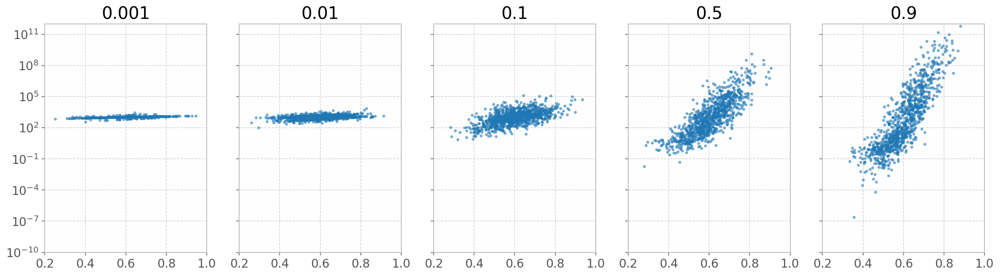

In [167]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_talent_luck_work_capitalism(P_event=P_event, P_lucky=0.5, w_Talent=1, interest_rate=0.05,
                                                 C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

## Varying interest rates

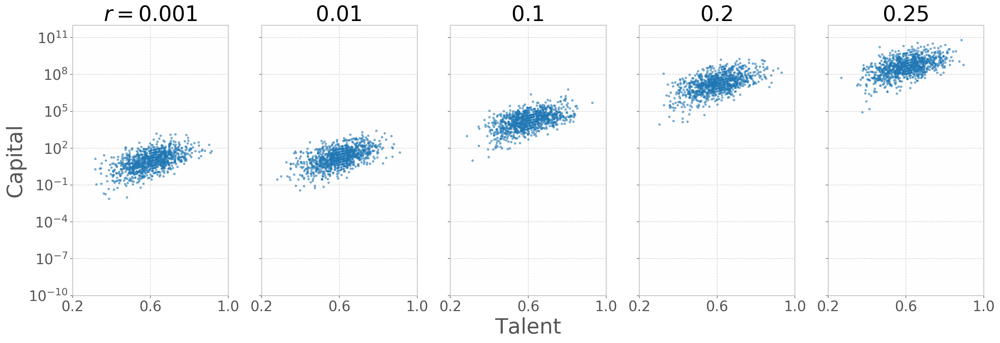

In [986]:
interest_rates = [0.001, 0.01, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(interest_rates), sharey=True, figsize=(20,7))
for i, (interest_rate, ax) in enumerate(zip(interest_rates, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event=0.1, w_Talent=0, interest_rate=interest_rate)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$r=$'+str(interest_rate), fontsize=30)
    else:
        ax.set_title(str(interest_rate), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('interest_without_paycheck.png')
plt.show();

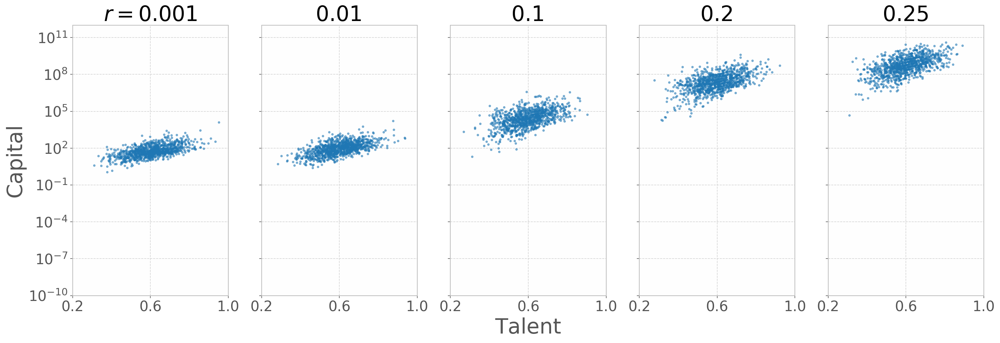

In [987]:
interest_rates = [0.001, 0.01, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(interest_rates), sharey=True, figsize=(20,7))
for i, (interest_rate, ax) in enumerate(zip(interest_rates, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event=0.1, w_Talent=1, interest_rate=interest_rate)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$r=$'+str(interest_rate), fontsize=30)
    else:
        ax.set_title(str(interest_rate), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('interest_with_paycheck.png')
plt.show();

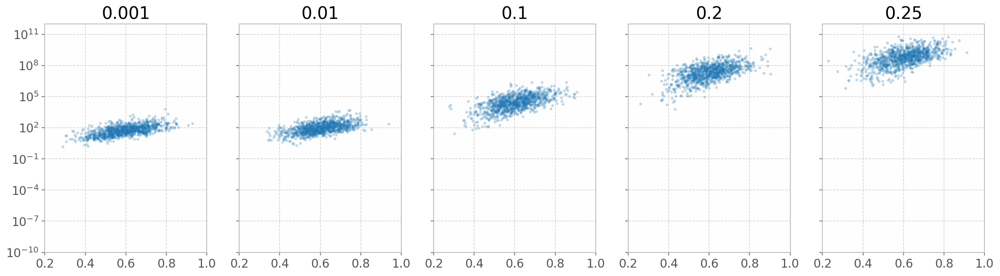

In [168]:
interest_rates = [0.001, 0.01, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(interest_rates), sharey=True, figsize=(20,5))
for interest_rate, ax in zip(interest_rates, axes):
    
    Cs, Ts = run_sim_talent_luck_work_capitalism(P_event=0.1, P_lucky=0.5, w_Talent=1, interest_rate=interest_rate,
                                                 C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(interest_rate))

plt.show();

In [ ]:
interest_rates = [0.001, 0.01, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(interest_rates), sharey=True, figsize=(20,5))
for interest_rate, ax in zip(interest_rates, axes):
    
    Cs, Ts = run_sim_talent_luck_work_capitalism(P_event=0.1, P_lucky=0.5, w_Talent=1, interest_rate=interest_rate,
                                                 C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5)
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(interest_rate))

plt.show();

## interest vs no interest

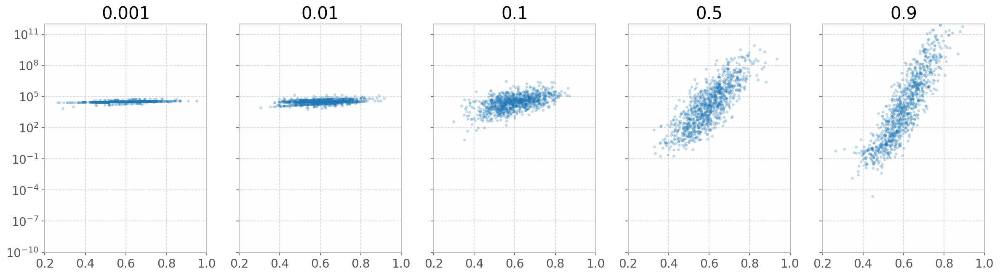

In [193]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):
    
    Cs, Ts = run_sim_talent_luck_work(P_event=P_event, P_lucky=0.5, w_Talent=1,
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)
    Cs_, Ts_ = run_sim_talent_luck_work_capitalism(P_event=P_event, P_lucky=0.5, w_Talent=1, 
                                                   interest_rate=0.1,
                     C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000)

#     ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='No interest')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Interest')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

# plt.legend()
plt.show();

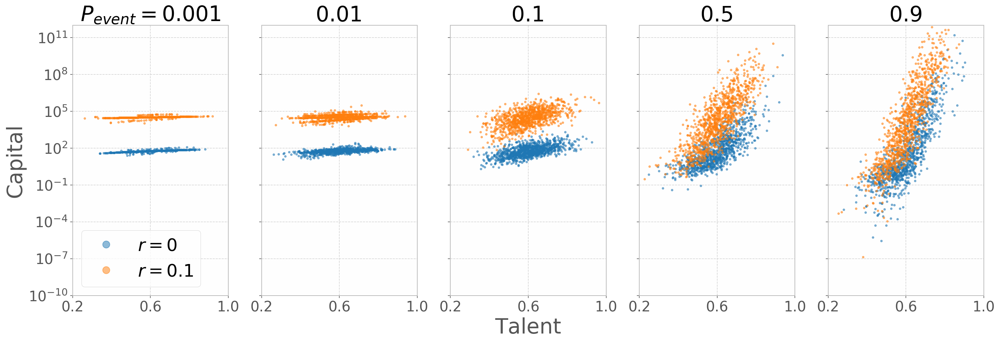

In [989]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0)
    Cs_, Ts_, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0.1)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='$r=0$')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='$r=0.1$')
    ax.set_xlim(0.2, 1)
    ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='lower left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('compare_interest_rate.png')
plt.show();

# Rich get luckier
P_lucky depends on capital (on average)

In [536]:
def neutral(interest_rate, w_T, Ts, Cs_prev):
    Cs_next = Cs_prev*(1+interest_rate) + w_T*Ts
    return Cs_next

def lucky(interest_rate, Ts, Cs_prev, use_default=False):
    if use_default:
        Cs_next = 2*Cs_prev*(1+interest_rate)
    else:            
        Cs_next = (1+Ts)*Cs_prev*(1+interest_rate)
    return Cs_next

def unlucky(interest_rate, Ts, Cs_prev, use_default=False):
    if use_default:
        Cs_next = 0.5*Cs_prev*(1+interest_rate)
    else:
        Cs_next = Ts*Cs_prev*(1+interest_rate)
    return Cs_next

In [312]:
def run_sim_rich_get_luckier(P_event=1/20, P_lucky0=0.5, w_Talent=1, interest_rate=0.1,
                             C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, turn_on=True):

    Ts = np.random.normal(mu_T, std_T, N)
    events_all = np.random.binomial(1, P_event, (N_timestamps, len(Ts)))

    C0s = np.ones(N)*C_0
    P_lucky0 = np.ones(N)*P_lucky0

    Cs_prev = C0s
    P_luckys = []
    P_lucky = P_lucky0
    for event_all in events_all:

        rands = np.random.random(N)
        good_luck = (rands < P_lucky)*event_all
        bad_luck = -1*(rands >= P_lucky)*event_all

        # nothing=0, good luck=1, bad luck = 0
        results = good_luck + bad_luck

        # apply events
        Cs_next = (results==0)*neutral(interest_rate, w_Talent, Ts, Cs_prev) \
                  + (results>0)*lucky(interest_rate, Ts, Cs_prev)       \
                  + (results<0)*unlucky(interest_rate, Ts, Cs_prev)

        P_luckys.append(P_lucky)
        # update parameters (recalibrate luck based on capital distribution)
        if turn_on:
            P_lucky = sp.norm.cdf(sp.mstats.zscore(Cs_next))
            
        Cs_prev = Cs_next

    return Cs_next, Ts

## default vs. rich get luckier

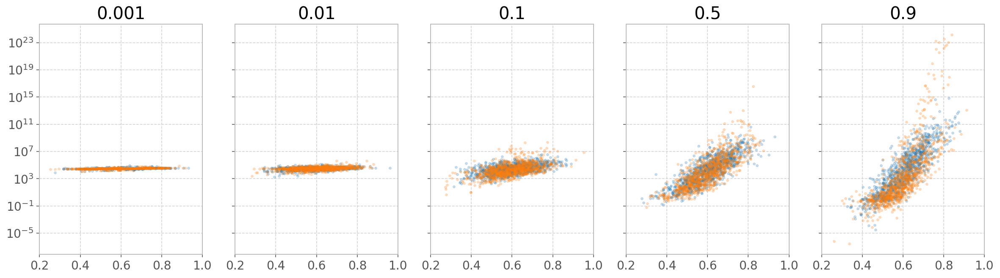

In [317]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier(P_event=P_event, P_lucky0=0.5, w_Talent=1, 
                                        interest_rate=0.1,
                                        C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                        turn_on=False)    

    Cs_, Ts_ = run_sim_rich_get_luckier(P_event=P_event, P_lucky0=0.5, w_Talent=1, 
                                        interest_rate=0.1,
                                        C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                        turn_on=True)    
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='S4')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

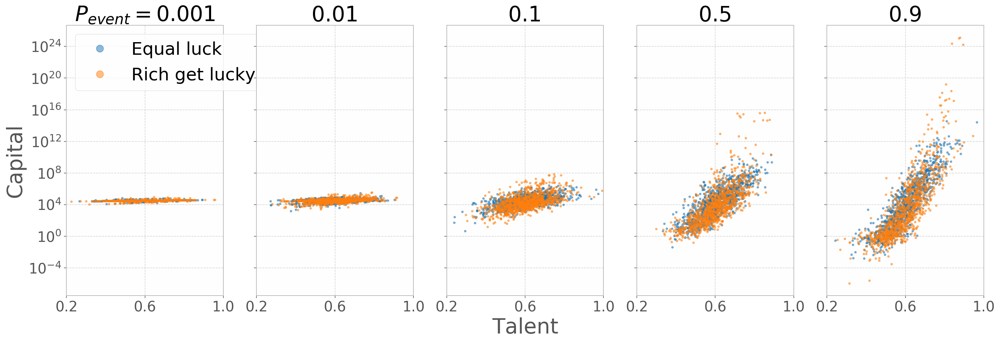

In [999]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0.1, turn_on_rich=False)
    Cs_, Ts_, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0.1, turn_on_rich=True)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='Equal luck')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='Rich get lucky')
    ax.set_xlim(0.2, 1)
#     ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='upper left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('compare_rich_luckier_with_paycheck.png')
plt.show();

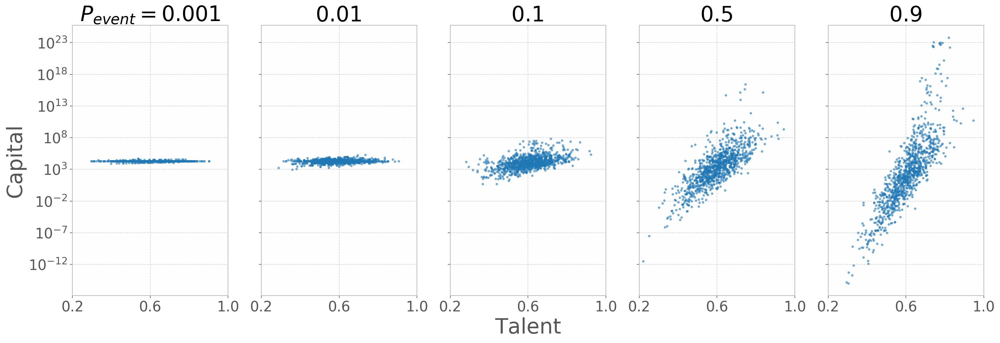

In [1013]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event, w_Talent=0, interest_rate=0.1, turn_on_rich=True)
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
#     ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('rich_luckeir_no_paycheck.png')
plt.show();

## x2, x.05 function

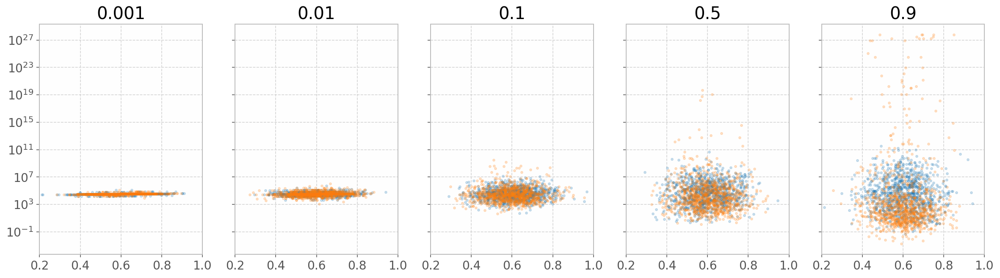

In [319]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier(P_event=P_event, P_lucky0=0.5, w_Talent=1, 
                                        interest_rate=0.1,
                                        C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                        turn_on=False)    

    Cs_, Ts_ = run_sim_rich_get_luckier(P_event=P_event, P_lucky0=0.5, w_Talent=1, 
                                        interest_rate=0.1,
                                        C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                        turn_on=True)    
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='S4')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

# Taxation

In [327]:
def run_sim_rich_get_luckier_taxed(P_event=1/20, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.4,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True):

    Ts = np.random.normal(mu_T, std_T, N)
    events_all = np.random.binomial(1, P_event, (N_timestamps, len(Ts)))

    C0s = np.ones(N)*C_0
    P_lucky0 = np.ones(N)*P_lucky0
    tax_rates0 = np.ones(N)*min_tax_rate

    Cs_prev = C0s
    P_lucky = P_lucky0
    tax_rates = tax_rates0
    for event_all in events_all:

        rands = np.random.random(N)
        good_luck = (rands < P_lucky)*event_all
        bad_luck = -1*(rands >= P_lucky)*event_all

        # nothing=0, good luck=1, bad luck = 0
        results = good_luck + bad_luck

        # apply events
        Cs_next = (results==0)*neutral(interest_rate, w_Talent, Ts, Cs_prev) \
                  + (results>0)*lucky(interest_rate, Ts, Cs_prev)       \
                  + (results<0)*unlucky(interest_rate, Ts, Cs_prev)

        # update parameters (recalibrate luck based on capital distribution)
        if turn_on_tax:
            tax_rates = sp.norm.cdf(sp.mstats.zscore(Cs_next))*(max_tax_rate-min_tax_rate)+min_tax_rate
            Cs_next = Cs_next*(1-tax_rates)
        
        if turn_on_rich:
            P_lucky = sp.norm.cdf(sp.mstats.zscore(Cs_next))
            
        Cs_prev = Cs_next

    return Cs_next, Ts

## no tax vs tax

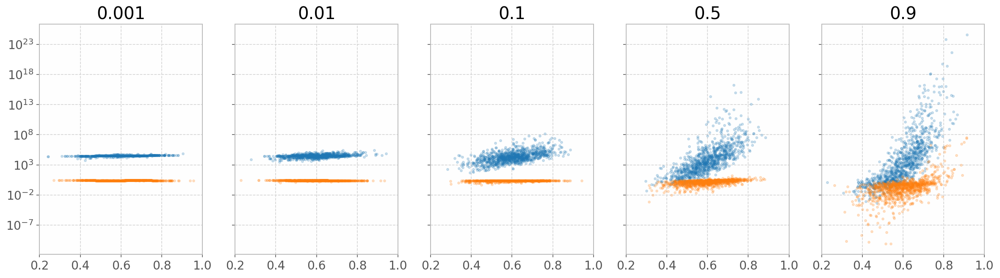

In [334]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier_taxed(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.4,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=False)
        
    Cs_, Ts_ = run_sim_rich_get_luckier_taxed(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.4,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

In [1014]:
0.99*0.3+0.1

0.3970

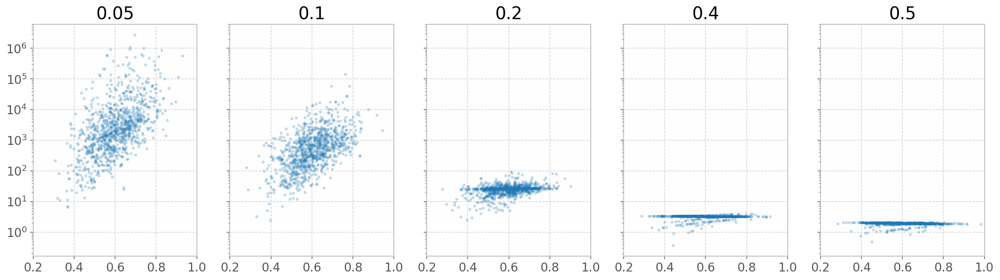

In [340]:
max_tax_rates = [0.05, 0.1, 0.2, 0.4, 0.5]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for max_tax_rate, ax in zip(max_tax_rates, axes):

    Cs_, Ts_ = run_sim_rich_get_luckier_taxed(P_event=0.1, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.01, max_tax_rate=max_tax_rate,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True)
    
#     ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(max_tax_rate))

plt.show();

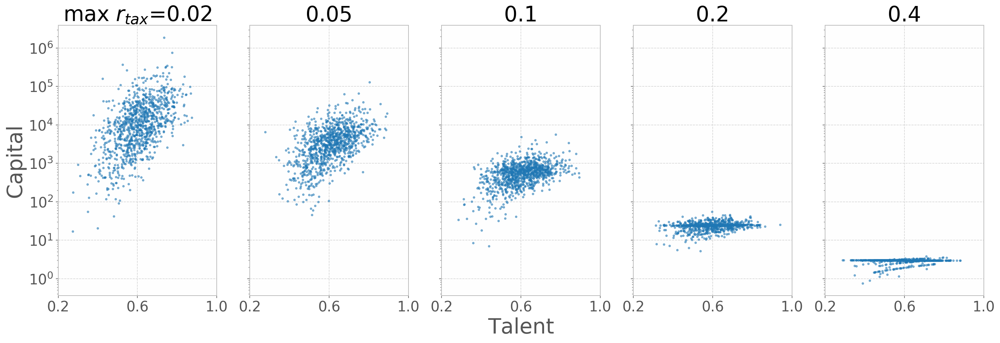

In [1023]:
max_tax_rates = [0.02, 0.05, 0.1, 0.2, 0.4]
min_tax_rate = 0.01

fig, axes = plt.subplots(1, len(max_tax_rates), sharey=True, figsize=(20,7))
for i, (max_tax_rate, ax) in enumerate(zip(max_tax_rates, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event=0.1, w_Talent=1, interest_rate=0.1,
                               max_tax_rate=max_tax_rate, min_tax_rate=min_tax_rate,
                               turn_on_tax=True)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5)
    ax.set_xlim(0.2, 1)
#     ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('max $r_{tax}$='+str(max_tax_rate), fontsize=30)
    else:
        ax.set_title(str(max_tax_rate), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('effect_tax.png')
plt.show();

In [348]:
def run_sim_rich_get_luckier_taxed_safenet(P_event=1/20, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.4,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True, turn_on_safenet=True):

    Ts = np.random.normal(mu_T, std_T, N)
    events_all = np.random.binomial(1, P_event, (N_timestamps, len(Ts)))

    C0s = np.ones(N)*C_0
    P_lucky0 = np.ones(N)*P_lucky0
    tax_rates0 = np.ones(N)*min_tax_rate

    Cs_prev = C0s
    P_lucky = P_lucky0
    tax_rates = tax_rates0
    for event_all in events_all:

        rands = np.random.random(N)
        good_luck = (rands < P_lucky)*event_all
        bad_luck = -1*(rands >= P_lucky)*event_all

        # nothing=0, good luck=1, bad luck = 0
        results = good_luck + bad_luck

        # apply events
        Cs_next = (results==0)*neutral(interest_rate, w_Talent, Ts, Cs_prev) \
                  + (results>0)*lucky(interest_rate, Ts, Cs_prev)       \
                  + (results<0)*unlucky(interest_rate, Ts, Cs_prev)

        # update parameters (recalibrate luck based on capital distribution)
        if turn_on_tax:
            tax_rates = sp.norm.cdf(sp.mstats.zscore(Cs_next))*(max_tax_rate-min_tax_rate)+min_tax_rate
            Cs_next = Cs_next*(1-tax_rates)
        
        if turn_on_rich:
            P_lucky = sp.norm.cdf(sp.mstats.zscore(Cs_next))
            
        if turn_on_safenet:
            Cs_next = np.max([Cs_next, C0s], axis=0)
            
        Cs_prev = Cs_next

    return Cs_next, Ts

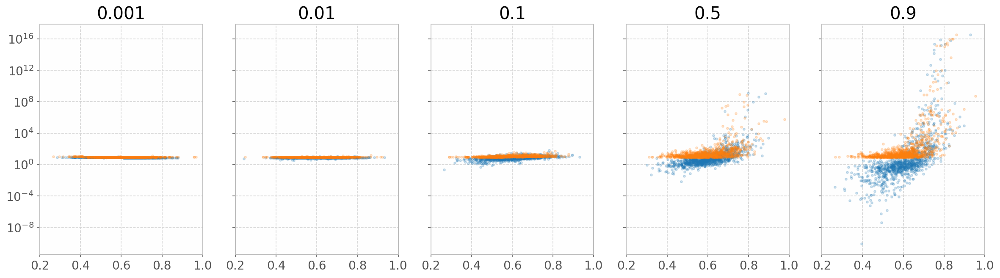

In [360]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True, turn_on_safenet=False)
        
    Cs_, Ts_ = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=True, turn_on_safenet=True)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

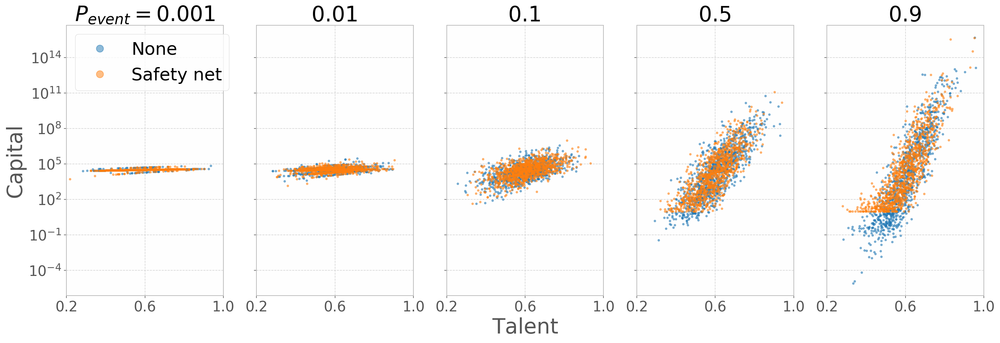

In [1026]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,7))
for i, (P_event, ax) in enumerate(zip(P_events, axes)):
    
    Cs, Ts, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0.1, turn_on_safenet=False)
    Cs_, Ts_, _, _ = run_sim_all(P_event, w_Talent=1, interest_rate=0.1, turn_on_safenet=True)
    
    ax.plot(Ts, Cs, '.', alpha=0.5, markersize=5, label='None')
    ax.plot(Ts_, Cs_, '.', alpha=0.5, markersize=5, label='Safety net')
    ax.set_xlim(0.2, 1)
#     ax.set_ylim(10e-11, 10e11)
    ax.set_xticks([0.2, 0.6, 1])
    ax.set_yscale('log')
    if i == 0:
        ax.set_title('$P_{event}=$'+str(P_event), fontsize=30)
    else:
        ax.set_title(str(P_event), fontsize=30)
    if i == 0:
        ax.set_ylabel('Capital', fontsize=30)
        lgnd = ax.legend(fontsize=25, loc='upper left')
        lgnd.legendHandles[0]._legmarker.set_markersize(20)
        lgnd.legendHandles[1]._legmarker.set_markersize(20)
    if i == 2:
        ax.set_xlabel('Talent', fontsize=30)
    ax.tick_params(labelsize='x-large')

plt.tight_layout()
plt.savefig('safety_net.png')
plt.show();

Other ideas
- uneven starting points (capital); not a big difference
- "rich get richer": the richer, the luckier
- paper idea: education (mean shift of talent distribution)
- paper idea: higher luck (see above); more opportunities
- Taxation: based on income (income brackets?)
- social safety net

Unevent starting point

including work does help reducing the inequality (band width)

what's next: parameter optimzation to estimate luck parameter!

# without work, interest rate comparison

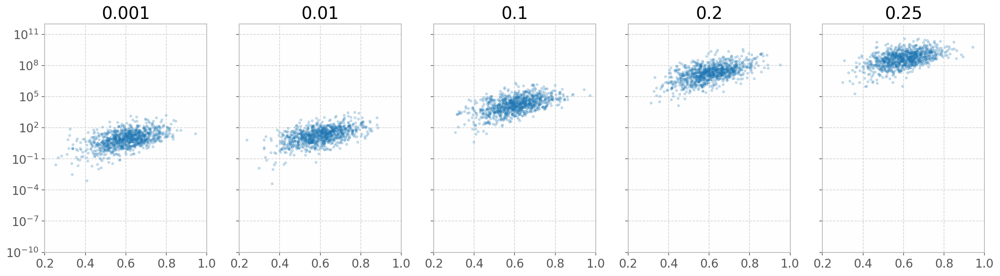

In [364]:
rates = [0.001, 0.01, 0.1, 0.2, 0.25]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for rate, ax in zip(rates, axes):

    Cs_, Ts_ = run_sim_rich_get_luckier_taxed(P_event=0.1, P_lucky0=0.5, 
                                   w_Talent=0, interest_rate=rate, min_tax_rate=0.01, max_tax_rate=0.4,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=False, turn_on_tax=False)
    
#     ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(rate))

plt.show();

# without work, no interest vs. interest

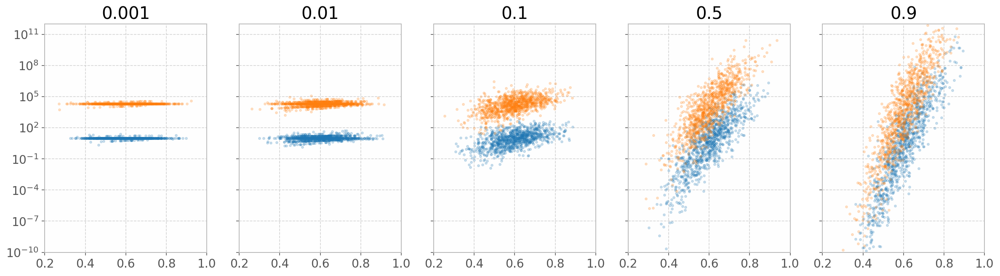

In [369]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=0, interest_rate=0, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=False, turn_on_tax=False, turn_on_safenet=False)
        
    Cs_, Ts_ = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=0, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=False, turn_on_tax=False, turn_on_safenet=False)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

# Work matters

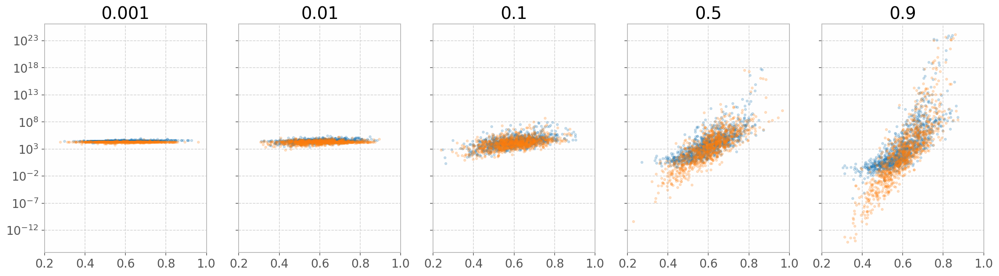

In [373]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=False, turn_on_safenet=False)
        
    Cs_, Ts_ = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=0, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=False, turn_on_safenet=False)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

/Users/honshi01/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:2247: RuntimeWarning: invalid value encountered in true_divide
  return (a - mns) / sstd
/Users/honshi01/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
/Users/honshi01/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
/Users/honshi01/anaconda3/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1735: RuntimeWarning: invalid value encountered in greater_equal
  cond2 = (x >= self.b) & cond0
/Users/honshi01/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in less
/Users/honshi01/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in greater_equal


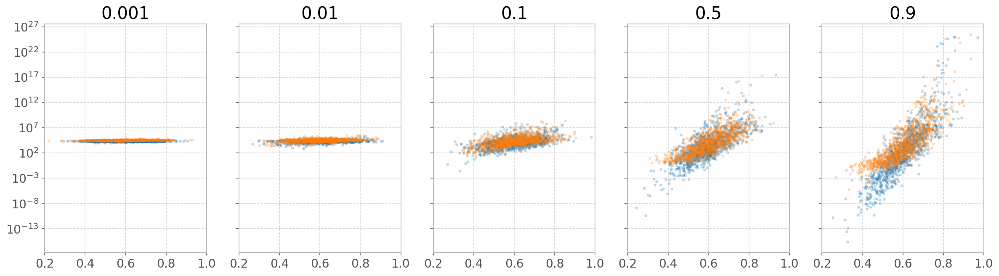

In [379]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=0, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=False, turn_on_safenet=False)
        
    Cs_, Ts_ = run_sim_rich_get_luckier_taxed_safenet(P_event=P_event, P_lucky0=0.5, 
                                   w_Talent=1, interest_rate=0.1, min_tax_rate=0.1, max_tax_rate=0.2,
                                   C_0=10, N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                                   turn_on_rich=True, turn_on_tax=False, turn_on_safenet=False)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
#     ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

# timing matters? (interest rate)

In [725]:
def run_sim_all(P_event=1/20, P_lucky0=0.5, use_default=False,
                w_Talent=1, interest_rate=0, 
                min_tax_rate=0.1, max_tax_rate=0.4,
                N_timestamps=80, mu_T=0.6, std_T=0.1, N=1000, 
                turn_on_rich=False, turn_on_tax=False, turn_on_safenet=False,
                T_dist='normal', C_even=True, mu_C=10, std_C=2):

    if T_dist == 'normal':
        Ts = np.random.normal(mu_T, std_T, N)
    elif T_dist == 'uniform':
        Ts = np.random.random(N)

    if C_even:
        C0s = np.ones(N)*mu_C
    else:
        C0s = np.random.normal(mu_C, std_C, N)    
    
    events_all = np.random.binomial(1, P_event, (N_timestamps, len(Ts)))    
    
    P_lucky0 = np.ones(N)*P_lucky0
    tax_rates0 = np.ones(N)*min_tax_rate

    Cs_prev = C0s
    P_lucky = P_lucky0
    tax_rates = tax_rates0
    Cs_all = [Cs_prev]
    results_all = []
    for event_all in events_all:

        rands = np.random.random(N)
        good_luck = (rands < P_lucky)*event_all
        bad_luck = -1*(rands >= P_lucky)*event_all

        # nothing=0, good luck=1, bad luck = 0
        results = good_luck + bad_luck

        # apply events
        Cs_next = (results==0)*neutral(interest_rate, w_Talent, Ts, Cs_prev) \
                  + (results>0)*lucky(interest_rate, Ts, Cs_prev, use_default)       \
                  + (results<0)*unlucky(interest_rate, Ts, Cs_prev, use_default)

        # update parameters (recalibrate luck based on capital distribution)
        if turn_on_tax:
            tax_rates = sp.norm.cdf(sp.mstats.zscore(Cs_next))*(max_tax_rate-min_tax_rate)+min_tax_rate
            Cs_next = Cs_next*(1-tax_rates)
        
        if turn_on_rich:
            P_lucky = sp.norm.cdf(sp.mstats.zscore(Cs_next))
            
        if turn_on_safenet:
            Cs_next = np.max([Cs_next, C0s], axis=0)
            
        Cs_prev = Cs_next
        
        Cs_all.append(Cs_next)
        results_all.append(results)

    results_all.append(np.zeros(N))
        
    return Cs_next, Ts, np.array(Cs_all), np.array(results_all)

the function works fine

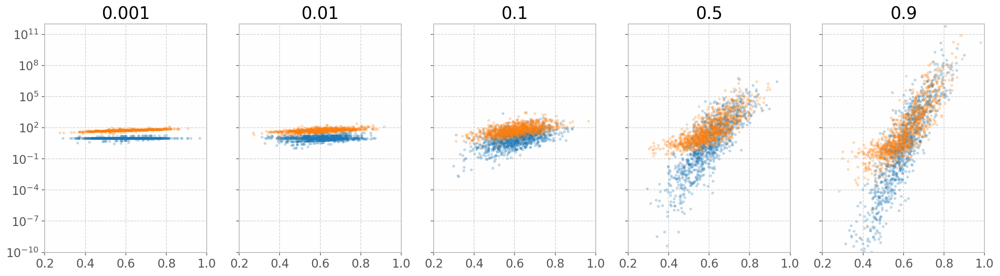

In [539]:
P_events = [0.001, 0.01, 0.1, 0.5, 0.9]

fig, axes = plt.subplots(1, len(P_events), sharey=True, figsize=(20,5))
for P_event, ax in zip(P_events, axes):

    Cs, Ts, Cs_all, results_all = run_sim_all(P_event=P_event, w_Talent=0)
    Cs_, Ts_, Cs_all_, results_all_ = run_sim_all(P_event=P_event, w_Talent=1)
    
    ax.plot(Ts, Cs, '.', alpha=0.2, markersize=5, label='Default')
    ax.plot(Ts_, Cs_, '.', alpha=0.2, markersize=5, label='Taxed')
    ax.set_xlim(0.2, 1)
    ax.set_yscale('log')
    ax.set_ylim(10e-11, 10e11)
    ax.set_title(str(P_event))

plt.show();

# visulize timeline

In [873]:
def plot_C_over_t(Cs_t, results_t, s_title='', scale='log', fname='test'):

    plt.figure(figsize=(20,8))
    plt.plot(Cs_t,':',color='gray')
    for event_ind, color in zip([-1, 1], (colors[3], colors[0])):
        inds = np.argwhere(results_t==event_ind)
        plt.plot(inds, Cs_t[inds], '.', color=color, markersize=30)
        
    plt.title(s_title, fontsize=30)
    plt.xlabel('Time', fontsize=30)
    plt.ylabel('Capital', fontsize=30)
    plt.yscale(scale)
    plt.tick_params(labelsize='x-large')
    plt.tight_layout()

    if fname:
        plt.savefig(fname+'.png')
    
    plt.show()

## default, P_event=0.1

unlucky

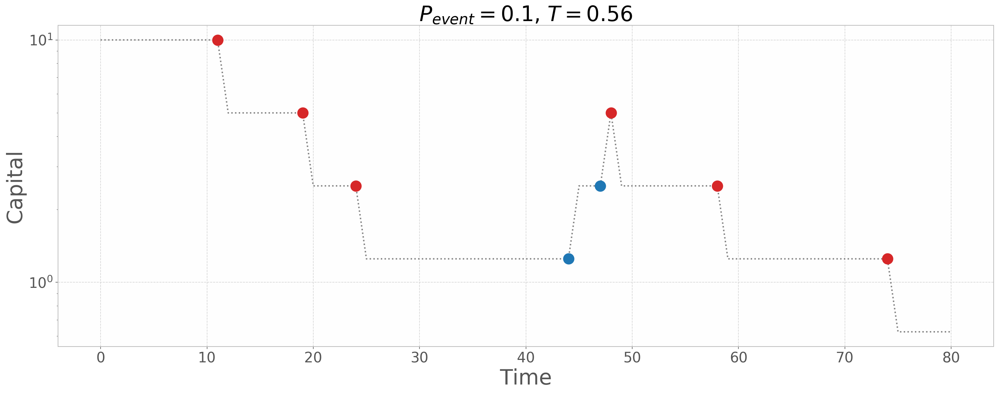

In [881]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, use_default=True)
plot_C_over_t(Cs_all[:,0], results_all[:,0], '$P_{event}=0.1$, $T=$'+str(np.round(Ts[0],2)), 
              fname='default_lucky')

lucky

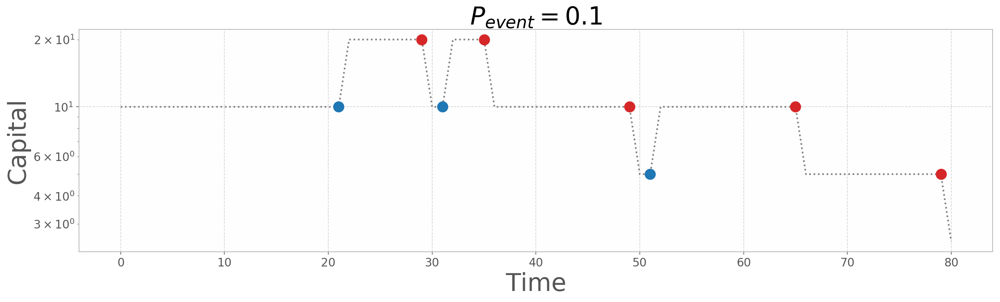

In [782]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, use_default=True)
plot_C_over_t(Cs_all[:,0], results_all[:,0], '$P_{event}=0.1$')

## default, P_event comparison

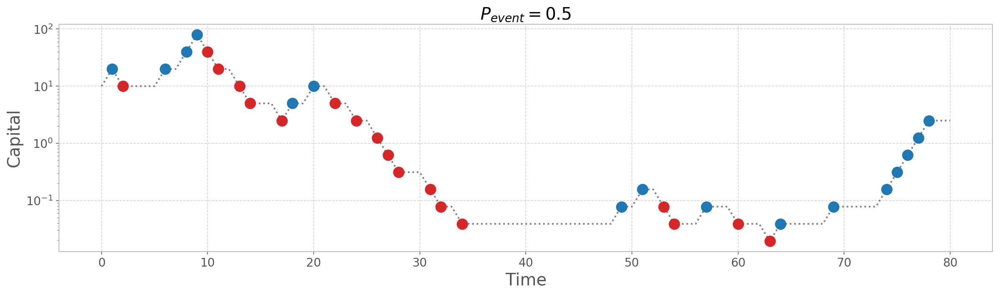

In [565]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.5, w_Talent=0, use_default=True)
plot_C_over_t(Cs_all[:,0], results_all[:,0], '$P_{event}=0.5$')

## talent-luck, P_event = 0.1

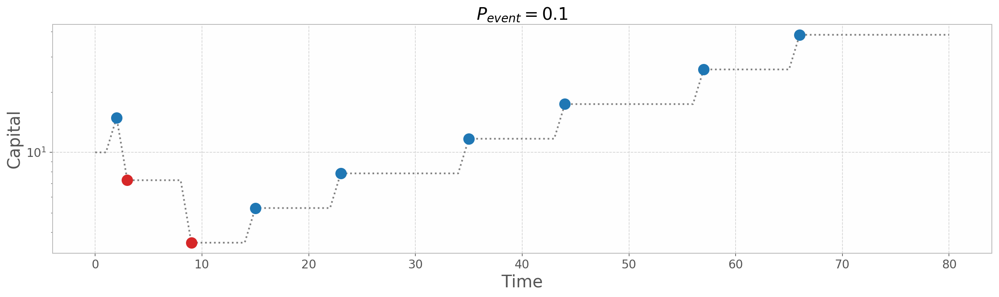

In [568]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], '$P_{event}=0.1$')

## Work(w=1), P_event =0.1

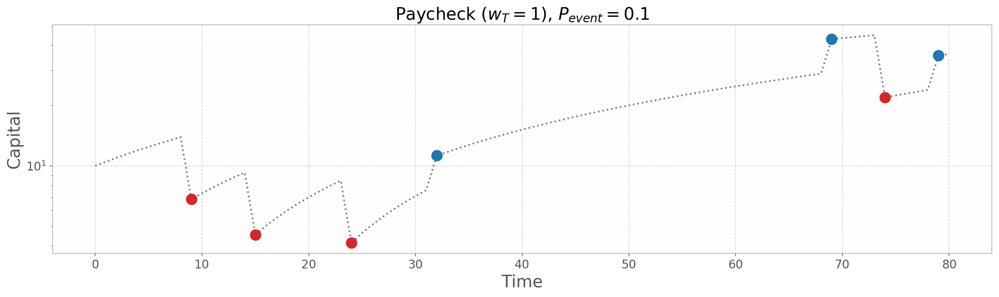

In [531]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=1)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$), $P_{event}=0.1$')

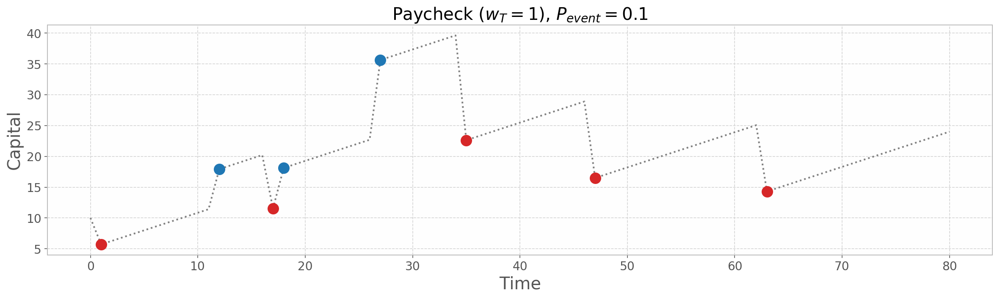

In [718]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=1)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$), $P_{event}=0.1$', 'linear')

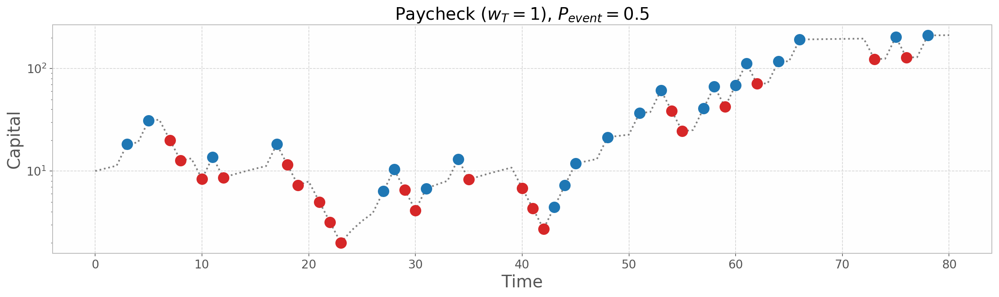

In [713]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.5, w_Talent=1)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$), $P_{event}=0.5$')

## interest rate

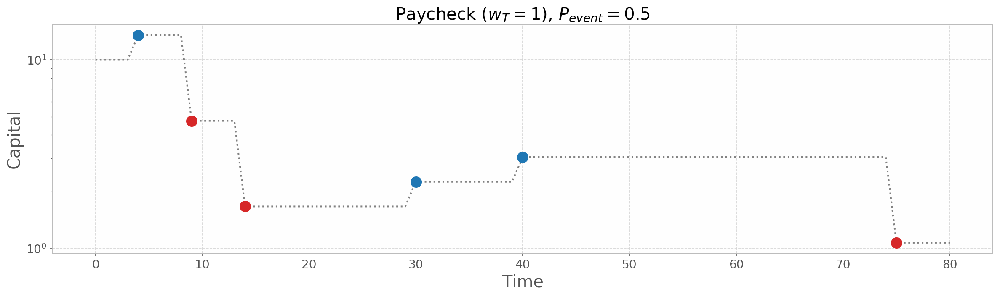

In [581]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, interest_rate=0.0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$), $P_{event}=0.5$')

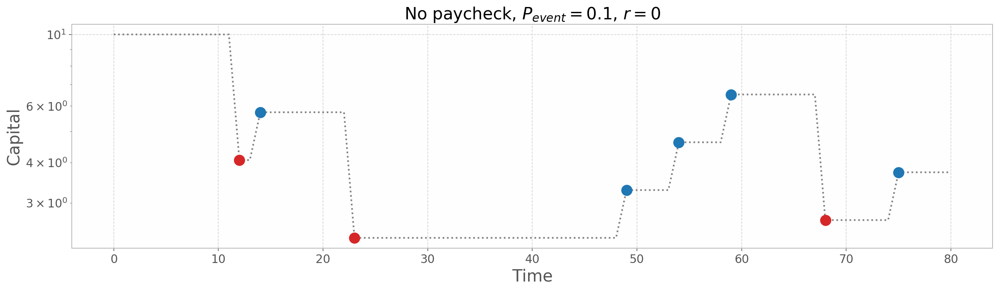

In [596]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, interest_rate=0.0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'No paycheck, $P_{event}=0.1$, $r=0$')

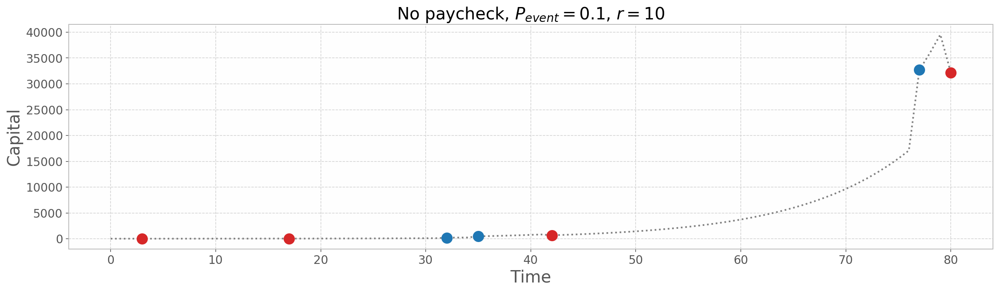

In [638]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=0, interest_rate=0.1)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'No paycheck, $P_{event}=0.1$, $r=10%$', 'linear')

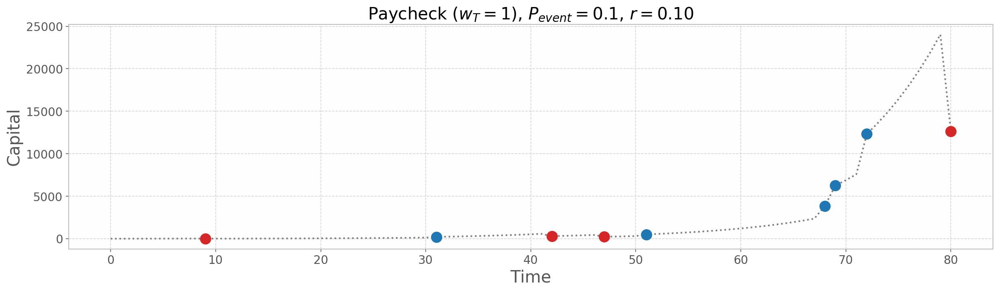

In [639]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, w_Talent=1, interest_rate=0.1)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$), $P_{event}=0.1$, $r=0.10$', 'linear')

## the worst: w/ vs. w/o work

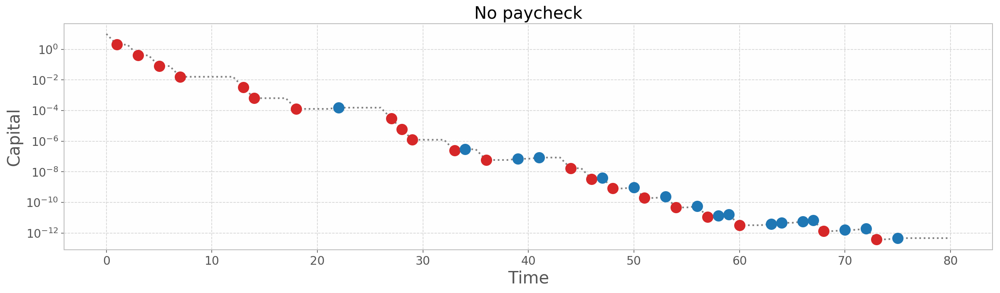

In [678]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.5, w_Talent=0, interest_rate=0, 
                                          turn_on_rich=True, mu_T=0.2, std_T=0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'No paycheck', 'log')

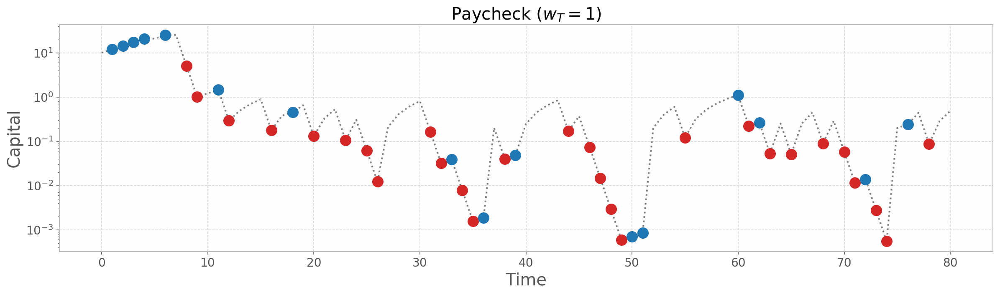

In [681]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.5, w_Talent=1, interest_rate=0, 
                                          turn_on_rich=True, mu_T=0.2, std_T=0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w_T=1$)', 'log')

## tax

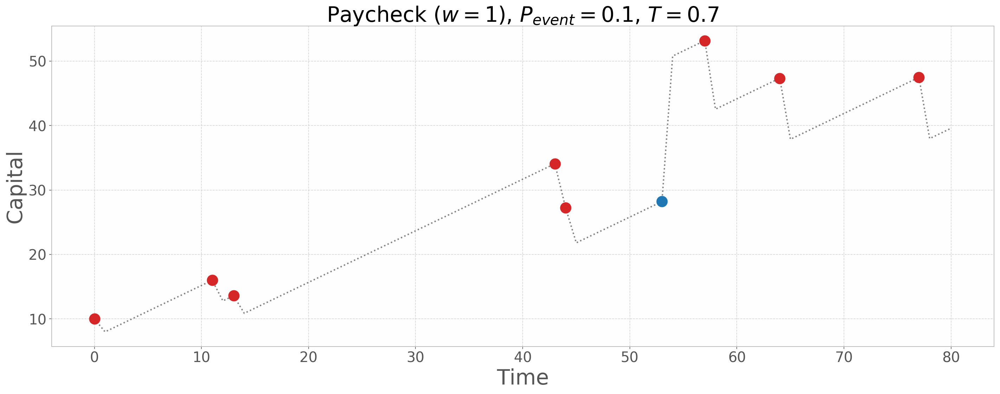

In [970]:
Cs, Ts, Cs_all, results_all = run_sim_all(P_event=0.1, P_lucky0=0.05, w_Talent=1,
                                          mu_T=0.8, std_T=0)
plot_C_over_t(Cs_all[:,0], results_all[:,0], 'Paycheck ($w=1$), $P_{event}=0.1$, $T=0.7$', 'linear', 'paycheck_effect')